In [1]:
import gym
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from JSAnimation.IPython_display import display_animation
from matplotlib import animation
from IPython.display import display

import tensorflow as tf

# to be viewed in jupyter
def display_frames_as_gif(frames):
    """
    Displays a list of frames as a gif, with controls
    """
    #plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames = len(frames), interval=20)
    display(display_animation(anim, default_mode='loop'))

In [2]:
# network predicting q values for every action
batch_size = 64
layer_sizes = [
    (8, 32),
    (32, 64),
    (64, 16),
    (16, 4)
]
n = len(layer_sizes)

graph = tf.Graph()
with graph.as_default():
    x = tf.placeholder(tf.float32, shape=(batch_size, layer_sizes[0][0]))
    x_single = tf.placeholder(tf.float32, shape=(1, layer_sizes[0][0]))
    y = tf.placeholder(tf.float32, shape=(batch_size, layer_sizes[-1][-1]))
    loss_weights = tf.placeholder(tf.float32, shape=(batch_size, layer_sizes[-1][-1]))
    w = []
    b = []
    w_frozen = []
    b_frozen = []
    for l in layer_sizes:
        w.append(tf.Variable(tf.truncated_normal(l, stddev=0.1)))
        b.append(tf.Variable(tf.zeros(l[-1])))
        
        w_frozen.append(tf.Variable(tf.zeros(l), trainable=False))
        b_frozen.append(tf.Variable(tf.zeros(l[-1]), trainable=False))
    
    output = x
    for i in range(n):
        output = tf.nn.xw_plus_b(output, w[i], b[i])
        if i < n-1: output = tf.nn.relu(output)
        # else: output = tf.nn.tanh(output)
    
    loss = tf.losses.mean_squared_error(y, output, loss_weights)
    optimizer = tf.train.AdamOptimizer(2e-5)
    train = optimizer.minimize(loss)
    
    ass = []
    for i in range(n):
        ass.append(tf.assign(w_frozen[i], w[i]))
        ass.append(tf.assign(b_frozen[i], b[i]))
        
    freeze = tf.group(ass)
    
    output_frozen = x
    for i in range(n):
        output_frozen = tf.nn.xw_plus_b(output_frozen, w[i], b[i])
        if i < n-1: output_frozen = tf.nn.relu(output_frozen)
        # else: output_frozen = tf.nn.tanh(output_frozen)
            
    output_frozen_single = x_single
    for i in range(n):
        output_frozen_single = tf.nn.xw_plus_b(output_frozen_single, w[i], b[i])
        if i < n-1: output_frozen_single = tf.nn.relu(output_frozen_single)
        # else: output_frozen_single = tf.nn.tanh(output_frozen_single)

[[0.0022047  0.00646426 0.00410926 0.00054302]] 1
[[0.001144   0.00640412 0.00494479 0.0003332 ]] 1
[[ 1.3074030e-03  7.5666709e-03  6.2080538e-03 -1.2067438e-05]] 1
[[ 0.00242752  0.01085352  0.00820069 -0.00175917]] 1
[[ 0.00516192  0.01626901  0.00842353 -0.00337189]] 1
[[ 0.00775229  0.02454201  0.01027864 -0.00603847]] 1
[[ 0.00957704  0.03319255  0.01010141 -0.00680791]] 1
[[ 0.02151986  0.06569671  0.03296451 -0.00187347]] 1



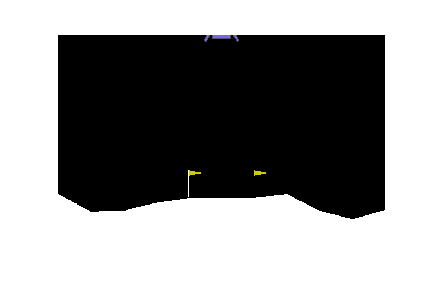
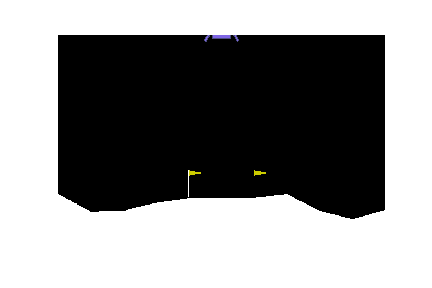
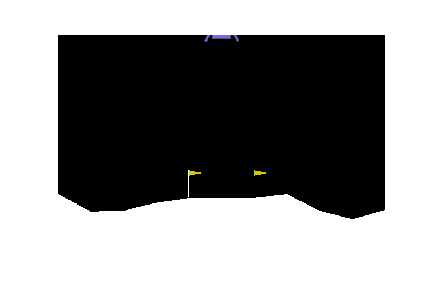
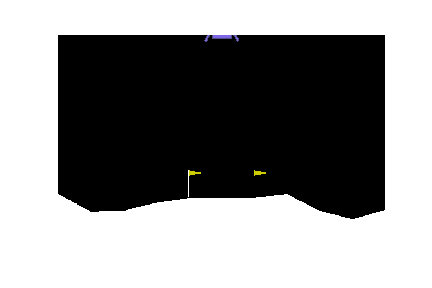
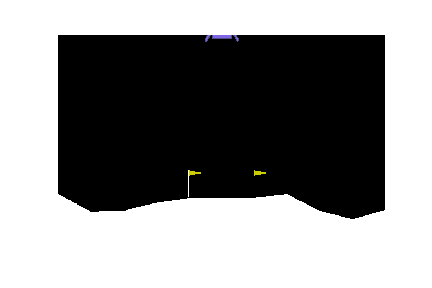
...
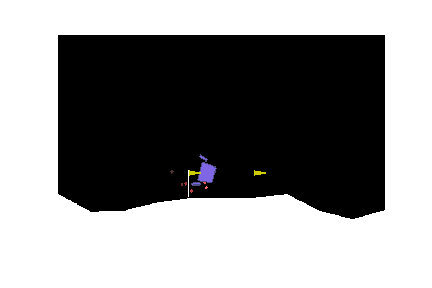
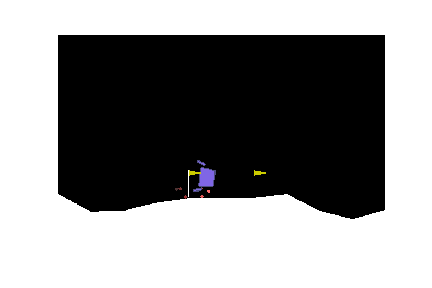
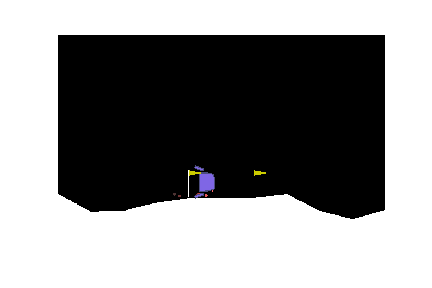
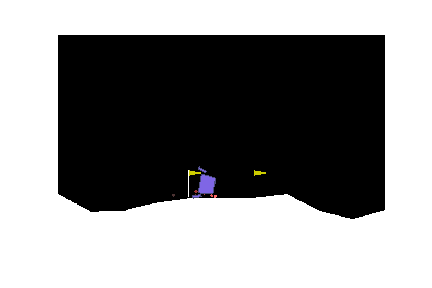
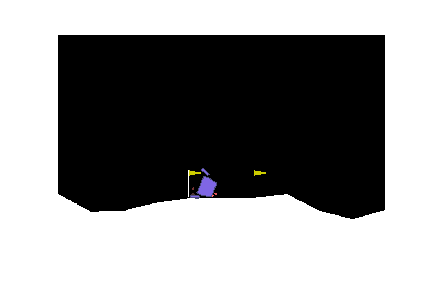

Episode 0 with reward -490.02456995590853
Episode 10 with reward -699.3960665430105
Episode 20 with reward -514.3376763250127
Episode 30 with reward -329.63173543828
Episode 40 with reward -230.53087599469455
Episode 50 with reward -79.86721363895455
Episode 60 with reward -63.59462839226907
Episode 70 with reward -75.35025328970787
Episode 80 with reward -67.65730405019663
Episode 90 with reward -64.9154607377259
[[0.15949851 0.16120054 0.16580893 0.15666544]] 2
[[0.16429417 0.16740191 0.16803925 0.16266784]] 2
[[0.16435954 0.16601853 0.1651326  0.16270491]] 1
[[0.15389733 0.15416737 0.1543412  0.15319803]] 2
[[0.15167947 0.15234724 0.15322113 0.15343544]] 3
[[0.15511614 0.15694809 0.15868543 0.15849546]] 2
[[0.15531985 0.15918817 0.15962705 0.15840471]] 2
[[0.1565098  0.16102718 0.16061552 0.16132179]] 3
[[0.15721726 0.16193007 0.16130085 0.16141212]] 1
[[0.1600237  0.16289218 0.16300412 0.16325772]] 3
[[0.16189083 0.16493835 0.16430314 0.16441044]] 1
[[0.16056415 0.16307211 0.163284


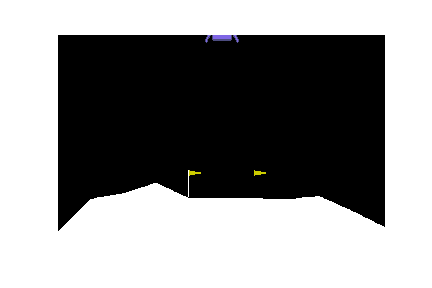
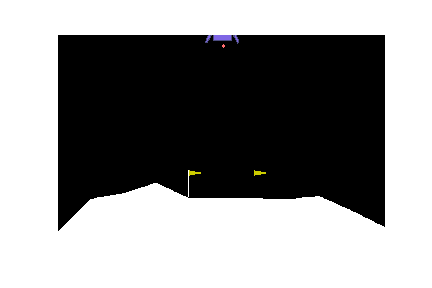
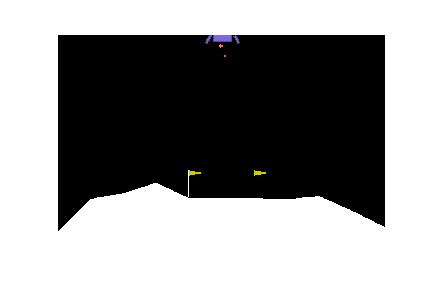
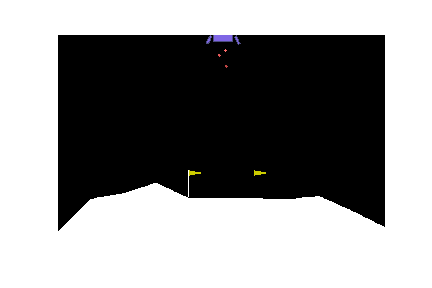
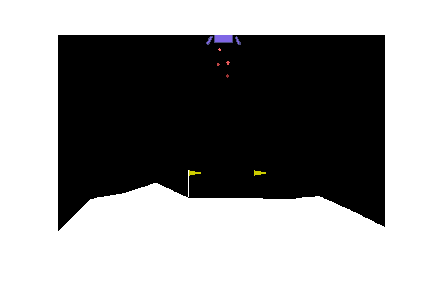
...
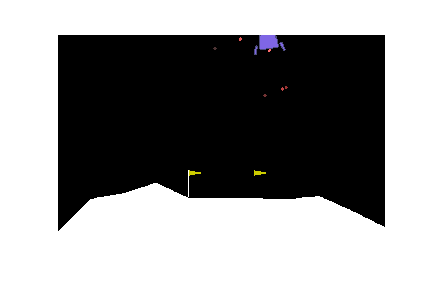
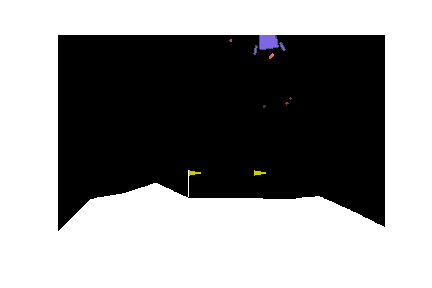
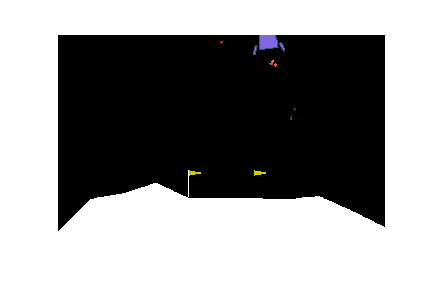
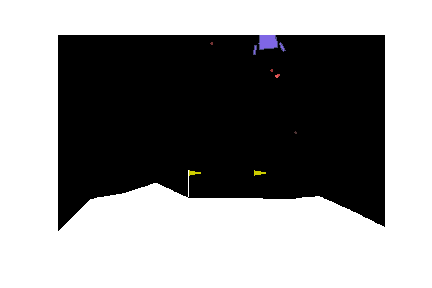
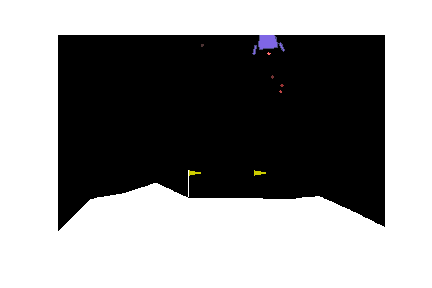

Episode 100 with reward -73.30988847163427
Episode 110 with reward -93.33125064331986
Episode 120 with reward -47.415799066112434
Episode 130 with reward -43.431207556064344
Episode 140 with reward -94.57221279375932
Episode 150 with reward -46.556053378547325
Episode 160 with reward -1.4656432745846102
Episode 170 with reward -179.42789789518582
Episode 180 with reward -221.8370512770444
Episode 190 with reward -51.89971227539033
[[0.29099375 0.2969275  0.29114082 0.29232457]] 1
[[0.28704768 0.29291233 0.2955443  0.2943613 ]] 2
[[0.29184228 0.2974115  0.2977436  0.29669183]] 2
[[0.29180628 0.29686123 0.29831013 0.29738963]] 2
[[0.28888804 0.29368964 0.29417932 0.2940239 ]] 2
[[0.28122193 0.28464574 0.28495115 0.28517056]] 3
[[0.28070349 0.28370452 0.284585   0.2841717 ]] 2
[[0.2831028  0.28570396 0.28771856 0.2859034 ]] 2
[[0.27745074 0.2808416  0.28124654 0.28094673]] 2
[[0.28021333 0.28327227 0.28610057 0.28423312]] 2
[[0.27846137 0.2817542  0.2814747  0.28145957]] 1
[[0.27629635 0.


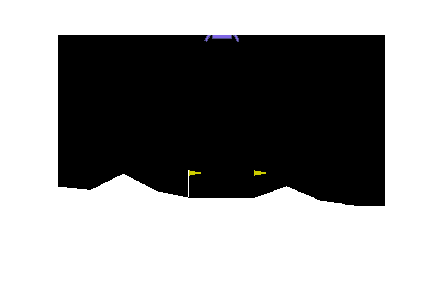
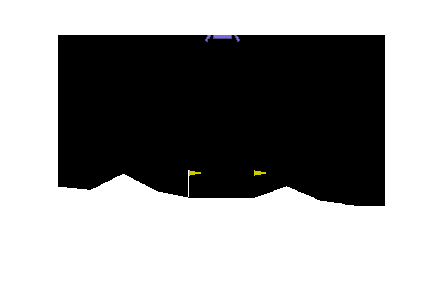
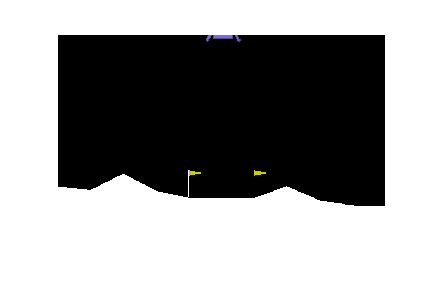
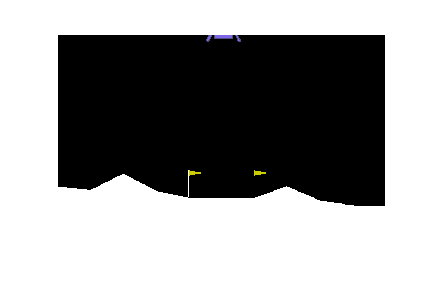
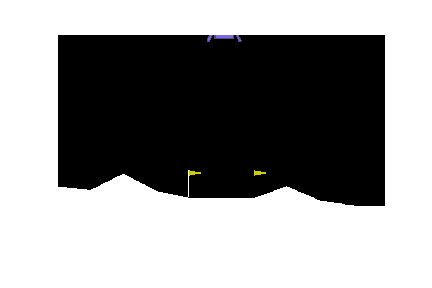
...
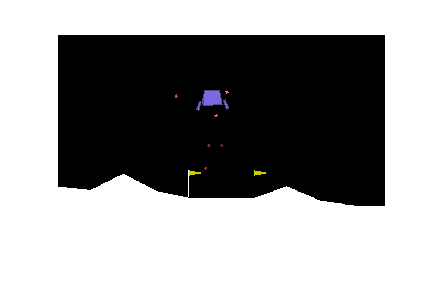
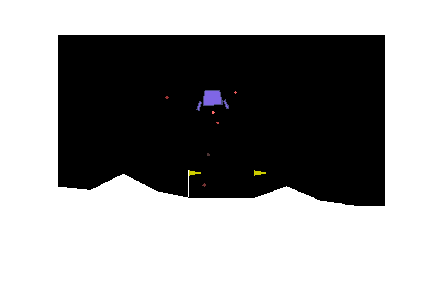
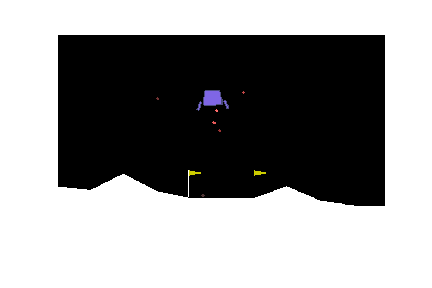
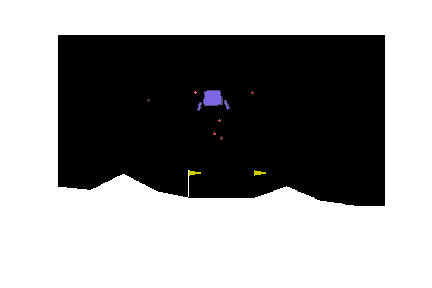
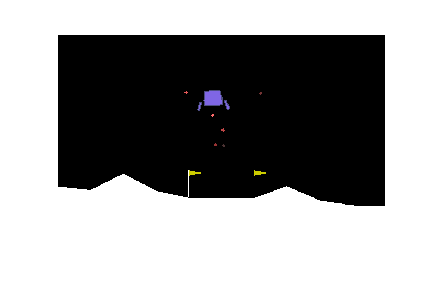

Episode 200 with reward -12.719236929520239
Episode 210 with reward -26.069605670023037
Episode 220 with reward 59.474220845109215
Episode 230 with reward 41.3980506620221
Episode 240 with reward -112.94616870171477
Episode 250 with reward -126.76839443885325
Episode 260 with reward -477.4992595445129
Episode 270 with reward -482.09074754180074
Episode 280 with reward -315.63312092436286
Episode 290 with reward -14.015494174683049
[[0.6348912  0.65322334 0.64593136 0.6340169 ]] 1
[[0.6195678  0.6282309  0.62934005 0.623974  ]] 2
[[0.5918225  0.60114306 0.6029157  0.60152847]] 2
[[0.60964924 0.61970514 0.62012565 0.620078  ]] 2
[[0.61595494 0.62573653 0.6266035  0.62493676]] 2
[[0.62979406 0.6402302  0.6408061  0.6394356 ]] 2
[[0.609682  0.6210097 0.6206918 0.6186372]] 1
[[0.59680045 0.6077265  0.6072712  0.6054718 ]] 1
[[0.5855867  0.59435153 0.59541535 0.5947868 ]] 2
[[0.59574944 0.60219306 0.60410196 0.6046301 ]] 3
[[0.6712202  0.6756459  0.67477936 0.67670494]] 3
[[0.69709355 0.7013


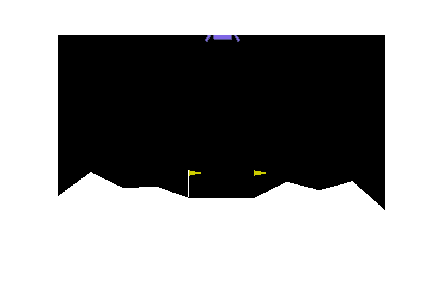
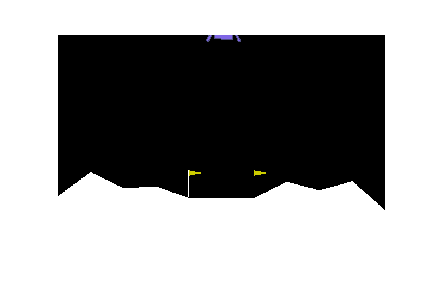
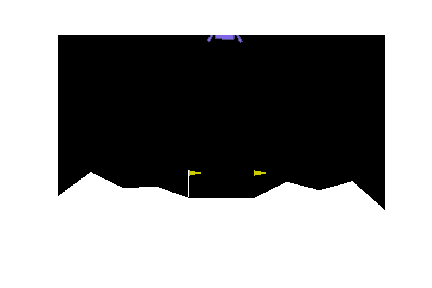
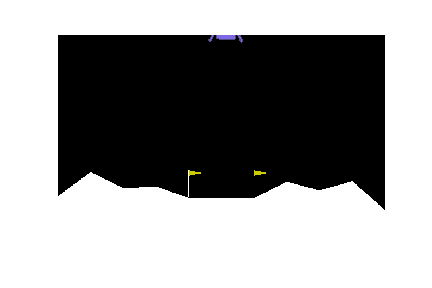
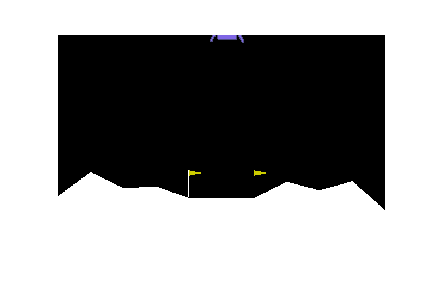
...
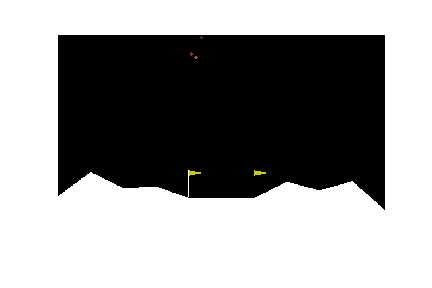
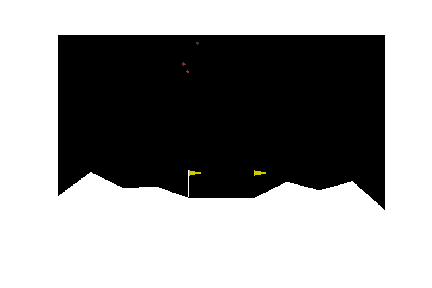
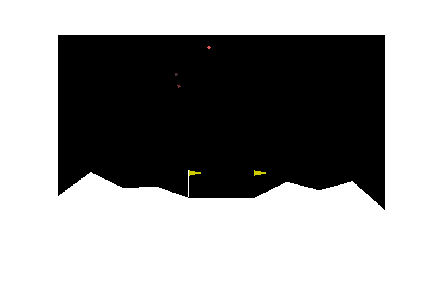
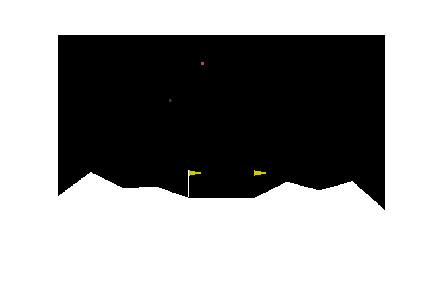
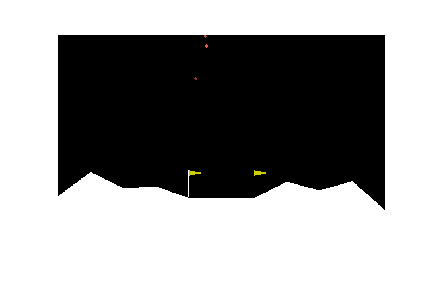

Episode 300 with reward -122.65116692631676
Episode 310 with reward 40.15527801063864
Episode 320 with reward 22.414966231288265
Episode 330 with reward 21.340037069007575
Episode 340 with reward 47.79533745633839
Episode 350 with reward -4.011725275216846
Episode 360 with reward 9.610127967444019
Episode 370 with reward -313.4901711620528
Episode 380 with reward 22.543785829295004
Episode 390 with reward 46.677320799983875
[[0.37930655 0.38114813 0.38263625 0.38694683]] 3
[[0.391201   0.39441702 0.39489508 0.3942918 ]] 2
[[0.3881471  0.39155817 0.3914125  0.39058736]] 1
[[0.38715777 0.38963112 0.3897447  0.38881388]] 2
[[0.3890706  0.39023513 0.3913617  0.39039195]] 2
[[0.3909786  0.39245984 0.39335015 0.39227054]] 2
[[0.3859577  0.3874443  0.38743886 0.38758394]] 3
[[0.3866376  0.38776854 0.3880266  0.38823482]] 3
[[0.39259475 0.39461875 0.39460337 0.39379334]] 1
[[0.3936201  0.39548582 0.39557213 0.39417142]] 2
[[0.39300695 0.39462507 0.39537224 0.39397147]] 2
[[0.39766732 0.4002167


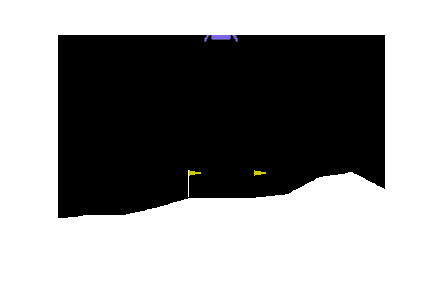
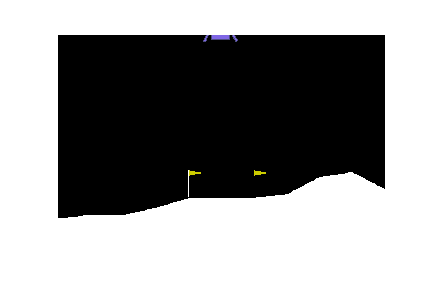
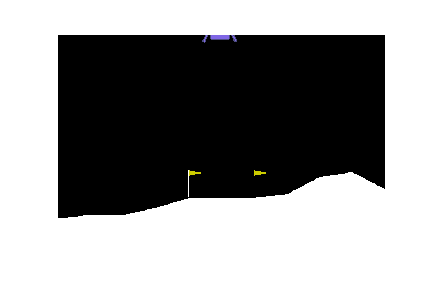
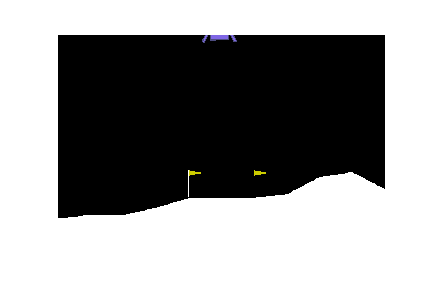
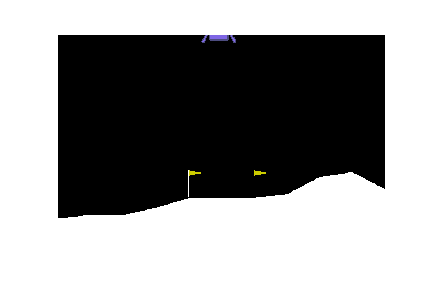
...
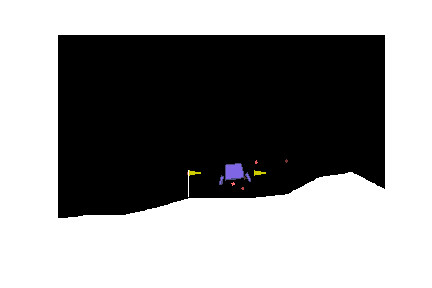
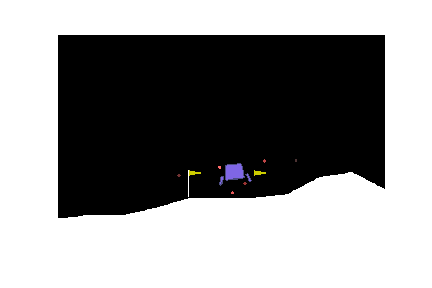
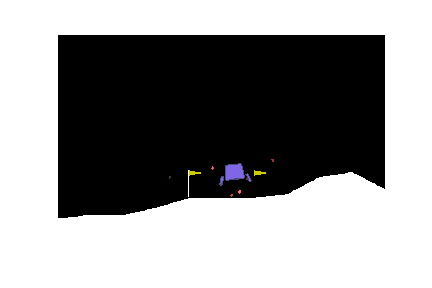
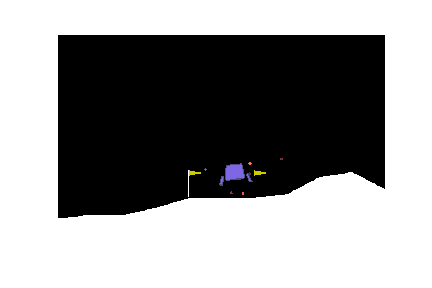
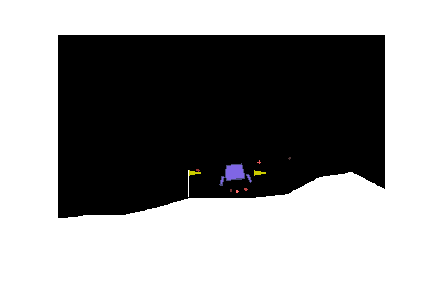

Episode 400 with reward 60.09440214382602
Episode 410 with reward 18.231610796977282
Episode 420 with reward -7.18173524366751
Episode 430 with reward -213.39666645121068
Episode 440 with reward -60.07840510657333
Episode 450 with reward -258.7170519449207
Episode 460 with reward 71.99325745481852
Episode 470 with reward -129.93994970013765
Episode 480 with reward 17.713098646955643
Episode 490 with reward 29.217732483672044
[[0.32663077 0.33435336 0.33001828 0.33273715]] 1
[[0.32532206 0.32737944 0.32623464 0.327863  ]] 3
[[0.31280318 0.31269777 0.31202292 0.31035128]] 0
[[0.35779595 0.35754392 0.35777733 0.3518834 ]] 0
[[0.34693882 0.34542328 0.34696272 0.34228432]] 2
[[0.3054972  0.30246094 0.30581012 0.30407926]] 2
[[0.2888115  0.2862589  0.28867418 0.2886051 ]] 0
[[0.2995683 0.2972507 0.2995309 0.2992197]] 0
[[0.31302062 0.3111375  0.31328055 0.3127807 ]] 2
[[0.31334367 0.31220773 0.3142869  0.31379774]] 2
[[0.28214017 0.28101137 0.28325877 0.28314403]] 2
[[0.29936674 0.30062285 0

Episode 500 with reward 18.50040057698905
Episode 510 with reward -224.59009202824123
Episode 520 with reward -46.718866979930226
Episode 530 with reward -21.764403607149262
Episode 540 with reward -28.218744158604334
Episode 550 with reward -727.6362671580945
Episode 560 with reward -1272.6919433171659
Episode 570 with reward -2451.2118937215964
Episode 580 with reward -449.79904637216146
Episode 590 with reward -934.4105582211382
[[0.5296757 0.5302591 0.5237421 0.5193944]] 1
[[0.4950459  0.49428087 0.49144226 0.48527312]] 0
[[0.46209288 0.46038133 0.4601391  0.45223284]] 0
[[0.45246333 0.45034552 0.45195276 0.44256145]] 0
[[0.46509442 0.46349603 0.46489683 0.45578074]] 0
[[0.47232255 0.4712029  0.4722891  0.46412265]] 0
[[0.48557416 0.48543757 0.485581   0.47835743]] 2
[[0.45788902 0.45778626 0.45851484 0.45279282]] 2
[[0.49073112 0.49076748 0.4926727  0.48796332]] 2
[[0.5101157  0.50990474 0.51323056 0.5093663 ]] 2
[[0.51573074 0.5150126  0.51966447 0.51679957]] 2
[[0.5620355 0.5601

Episode 600 with reward -211.81559062866188
Episode 610 with reward 48.27285608850198
Episode 620 with reward -211.89047228478523
Episode 630 with reward 41.768621813063774
Episode 640 with reward 62.68928293779676
Episode 650 with reward 81.5672895761126
Episode 660 with reward 97.17971160231409
Episode 670 with reward 90.9774163592412
Episode 680 with reward 85.40174427710942
Episode 690 with reward 24.70054126216175
[[0.35988736 0.3577063  0.35690865 0.36274913]] 3
[[0.35106048 0.3511536  0.3454953  0.3504044 ]] 1
[[0.36311638 0.363003   0.36040893 0.3608655 ]] 0
[[0.37608746 0.37542027 0.37574887 0.37396514]] 0
[[0.37464705 0.3736319  0.37493697 0.37307242]] 2
[[0.3558474  0.35451332 0.35601518 0.35467923]] 2
[[0.3395833  0.33655244 0.33964792 0.33954588]] 2
[[0.35602233 0.3528047  0.35586503 0.35595483]] 0
[[0.3737618 0.3716923 0.3737963 0.3728777]] 2
[[0.3574473  0.35494742 0.3573551  0.35729304]] 0
[[0.3582823  0.35611573 0.35827434 0.35798863]] 0
[[0.3609125  0.35924068 0.36085

Episode 700 with reward 217.54615581655122
Episode 710 with reward 43.54336904750523
Episode 720 with reward -8.716358248389483
Episode 730 with reward -23.77171839225585
Episode 740 with reward 26.29238039792908
Episode 750 with reward 56.949945819844444
Episode 760 with reward 53.613876431300454
Episode 770 with reward 39.40689852256477
Episode 780 with reward -37.24918238415576
Episode 790 with reward 69.49076810802028
[[0.20589261 0.20903026 0.20595169 0.2045271 ]] 1
[[0.15618123 0.1571459  0.15712294 0.15620838]] 1
[[0.18423928 0.18460493 0.18485102 0.18441798]] 2
[[0.20013888 0.19894628 0.20010003 0.199914  ]] 0
[[0.20063381 0.19780616 0.20072883 0.20032652]] 2
[[0.19763218 0.19326635 0.19762474 0.19746034]] 0
[[0.20434295 0.19838877 0.20430917 0.20396774]] 0
[[0.21513747 0.20815589 0.21527043 0.21469302]] 2
[[0.19854344 0.19200553 0.19853774 0.19837235]] 0
[[0.1720853  0.16694625 0.17211384 0.17140718]] 2
[[0.16498797 0.16116811 0.16518226 0.16409834]] 2
[[0.14377849 0.1421922  

Episode 800 with reward 41.19944103652057
Episode 810 with reward 77.3714758921658
Episode 820 with reward -203.63581326213983
Episode 830 with reward -178.0174168392862
Episode 840 with reward -20.026460598855138
Episode 850 with reward 44.91025208721619
Episode 860 with reward 35.37500665097888
Episode 870 with reward -85.10273675764084
Episode 880 with reward -58.17590430902142
Episode 890 with reward -67.30507609069164
[[0.2000344  0.20219894 0.20043637 0.20376645]] 3
[[0.19520478 0.1957684  0.1962695  0.19556959]] 2
[[0.20841213 0.20873483 0.20889671 0.20923941]] 3
[[0.20255311 0.2029018  0.20288886 0.20284583]] 1
[[0.19992171 0.20006455 0.20035042 0.199569  ]] 2
[[0.18255876 0.18271415 0.18270145 0.18232168]] 1
[[0.17797743 0.17766665 0.178528   0.17785163]] 2
[[0.17672004 0.17630844 0.17731212 0.17703582]] 2
[[0.17440645 0.17478888 0.1743847  0.17378022]] 1
[[0.16427852 0.16420962 0.16421424 0.16452895]] 3
[[0.14656208 0.14613007 0.14669408 0.14685453]] 3
[[0.14784388 0.14673902

Episode 900 with reward 7.42588207218835
Episode 910 with reward 60.48047313346035
Episode 920 with reward 17.015347666633254
Episode 930 with reward 52.4355465552571
Episode 940 with reward 8.958521756848448
Episode 950 with reward 37.598549705025405
Episode 960 with reward 71.02143565391351
Episode 970 with reward 56.43507695247667
Episode 980 with reward 48.193893109457605
Episode 990 with reward -597.0199720785665
[[0.2091406  0.21212684 0.21273074 0.20559172]] 2
[[0.15330642 0.15604179 0.15620881 0.15257175]] 2
[[0.12806353 0.13085021 0.13088688 0.1287124 ]] 2
[[0.11443134 0.11694042 0.11706512 0.11638995]] 2
[[0.11177935 0.11394284 0.11442625 0.11428861]] 2
[[0.11855214 0.12049187 0.120703   0.11999388]] 2
[[0.11260881 0.11431376 0.11435246 0.11459632]] 3
[[0.12261435 0.12373049 0.1237488  0.1236677 ]] 2
[[0.13917199 0.13930024 0.14013323 0.13986145]] 2
[[0.1517834  0.15194611 0.1522404  0.15204419]] 2
[[0.15702277 0.15777357 0.15785256 0.15742184]] 2
[[0.15420121 0.15534039 0.15

Episode 1000 with reward 28.49707671847547
Episode 1010 with reward -4.722747347598029
Episode 1020 with reward 56.936126763062745
Episode 1030 with reward -19.814431329640573
Episode 1040 with reward -77.0342157539696
Episode 1050 with reward 54.52206190866517
Episode 1060 with reward 56.197086157000044
Episode 1070 with reward -23.822189328248292
Episode 1080 with reward -58.63304767934683
Episode 1090 with reward 76.38772318411995
[[0.15205969 0.15417127 0.151682   0.15406466]] 1
[[0.16038936 0.16194434 0.16164811 0.16182262]] 1
[[0.16555029 0.16724233 0.16718723 0.16647297]] 1
[[0.15901491 0.16068734 0.16046286 0.16018698]] 1
[[0.15988368 0.16122086 0.1613549  0.16153085]] 3
[[0.15269643 0.15428765 0.15429308 0.15383336]] 2
[[0.15306623 0.15475406 0.15479246 0.15395781]] 2
[[0.14874327 0.15035786 0.15026535 0.14993684]] 1
[[0.14404942 0.14566325 0.14550185 0.14526936]] 1
[[0.14514326 0.14645033 0.14655243 0.14673755]] 3
[[0.14201021 0.14365856 0.14338239 0.14325169]] 1
[[0.14364547

Episode 1100 with reward -3.7326975306385073
Episode 1110 with reward -42.627142518239815
Episode 1120 with reward 71.60491663948594
Episode 1130 with reward 32.870775387288674
Episode 1140 with reward 79.689171442819
Episode 1150 with reward 33.74630619455917
Episode 1160 with reward 14.738884200894644
Episode 1170 with reward 28.312393388300915
Episode 1180 with reward 79.76602100897601
Episode 1190 with reward 68.22710181394153
[[0.25668463 0.26035532 0.25748548 0.2557043 ]] 1
[[0.24785331 0.2491181  0.24843635 0.24956954]] 3
[[0.28115055 0.28195095 0.282474   0.28131545]] 2
[[0.25700074 0.25767908 0.25771335 0.25736922]] 2
[[0.23984957 0.24061431 0.2407359  0.24068686]] 2
[[0.23171288 0.23246856 0.23275056 0.2326738 ]] 2
[[0.22798583 0.22843273 0.22878931 0.22863096]] 2
[[0.21535635 0.21595548 0.2161656  0.21624649]] 3
[[0.2148866  0.21511249 0.21559289 0.2155363 ]] 2
[[0.21486622 0.21570316 0.21586215 0.2154926 ]] 2
[[0.17482659 0.17604312 0.17570943 0.17608565]] 3
[[0.22240159 0.

Episode 1200 with reward -179.01219046570392
Episode 1210 with reward -14.46949913025009
Episode 1220 with reward 32.94991925283884
Episode 1230 with reward 66.39938161109038
Episode 1240 with reward -52.195318000427164
Episode 1250 with reward 89.7570408494849
Episode 1260 with reward -10.769256841457413
Episode 1270 with reward 44.81208631803172
Episode 1280 with reward -112.21662106684036
Episode 1290 with reward 50.612441575076886
[[0.20848064 0.20356478 0.20816095 0.2126341 ]] 3
[[0.19374123 0.1905926  0.1929122  0.1937411 ]] 0
[[0.21030547 0.20814846 0.21002151 0.20884944]] 0
[[0.20900132 0.20797323 0.20899178 0.20641284]] 0
[[0.19170809 0.19182539 0.19201972 0.1884873 ]] 2
[[0.19378863 0.19462416 0.19474612 0.19054505]] 2
[[0.18417478 0.18549821 0.18539228 0.18132901]] 1
[[0.1518134  0.15191467 0.15220554 0.1503282 ]] 2
[[0.15028842 0.14887887 0.15014482 0.1499554 ]] 0
[[0.14939703 0.14778867 0.14937122 0.14905842]] 0
[[0.15961964 0.15776974 0.15967193 0.1597094 ]] 3
[[0.1618790

Episode 1300 with reward 46.884034733600515
Episode 1310 with reward -12.204641881430405
Episode 1320 with reward -193.8887429819472
Episode 1330 with reward 25.56146494288873
Episode 1340 with reward -751.4647291863797
Episode 1350 with reward -2212.4761348072043
Episode 1360 with reward -501.61359107192595
Episode 1370 with reward -1113.4972826362682
Episode 1380 with reward -3244.7272640003266
Episode 1390 with reward -1331.251253907978
[[6.1657    6.188459  6.2488823 6.112018 ]] 2
[[6.349665  6.360378  6.420045  6.3120775]] 2
[[6.664281  6.6607547 6.7187004 6.6428604]] 2
[[7.025888  7.0078735 7.0608263 7.0194564]] 2
[[7.4382753 7.3994293 7.456689  7.453487 ]] 2
[[7.773234  7.742967  7.7804832 7.7701507]] 2
[[8.148336 8.121613 8.145082 8.131955]] 0
[[8.172894 8.152033 8.174764 8.145708]] 2
[[8.355893 8.337149 8.355472 8.319595]] 0
[[8.419489  8.406572  8.4222145 8.371547 ]] 2
[[8.552291 8.548945 8.555427 8.488538]] 2
[[8.700779  8.6910715 8.703389  8.640144 ]] 2
[[9.006113 8.993975 

Episode 1400 with reward -439.5185795035167
Episode 1410 with reward -570.2900058283042
Episode 1420 with reward -485.81772702717876
Episode 1430 with reward -449.819720230653
Episode 1440 with reward -254.96835255679628
Episode 1450 with reward -673.1665442727959
Episode 1460 with reward -970.7190981783342
Episode 1470 with reward -1030.3392477367756
Episode 1480 with reward -122.78125670913965
Episode 1490 with reward -1693.022954449902
[[1014.30054 1005.2611  1020.3305  1024.4421 ]] 3
[[942.29816 935.8063  949.0938  949.0192 ]] 2
[[941.8001  935.38153 948.69324 948.4661 ]] 2
[[915.0527  909.0678  922.0522  921.33136]] 2
[[849.95636 845.0022  857.16327 855.3521 ]] 2
[[741.8903 738.3881 749.1385 745.9947]] 2
[[591.94257 590.45996 599.2609  594.26074]] 2
[[389.1518  390.21008 396.38626 389.26224]] 2


Episode 1500 with reward -616.8454902786606
Episode 1510 with reward -267.8544386152313
Episode 1520 with reward -1997.587859851741
Episode 1530 with reward -612.2483092437728
Episode 1540 with reward -566.7373544110724
Episode 1550 with reward -1032.6387484373836
Episode 1560 with reward -585.4828526842596
Episode 1570 with reward -3563.45638060112
Episode 1580 with reward -1833.701443509639
Episode 1590 with reward -579.5388387570235
[[2.8779905 2.9118836 2.8855343 2.8684769]] 1
[[3.1963494 3.2276294 3.2092323 3.1909852]] 1
[[2.386864  2.4163811 2.4028192 2.3961277]] 1
[[0.79826033 0.8743022  0.78795016 0.75741756]] 1
[[-0.06889328  0.02095348 -0.08920708 -0.12216485]] 1
[[-0.3711842  -0.2812249  -0.39817563 -0.4279977 ]] 1
[[-0.8959731 -0.806009  -0.934688  -0.9589039]] 1
[[-1.9763311 -1.8796318 -2.0346136 -2.052987 ]] 1
[[-2.7656443 -2.667895  -2.8408518 -2.851677 ]] 1


Episode 1600 with reward -672.7417931406654
Episode 1610 with reward -115.71725486436416
Episode 1620 with reward -3227.6341917143127
Episode 1630 with reward -117.0430254734374
Episode 1640 with reward -907.7992223471849
Episode 1650 with reward -1693.2584221338063
Episode 1660 with reward -252.51750134658815
Episode 1670 with reward -1348.0864971367985
Episode 1680 with reward -949.7338346516707
Episode 1690 with reward -447.3817627897359
[[11.215053 11.083541 11.387921 11.31451 ]] 2
[[10.225523  10.049464  10.3400755 10.325214 ]] 2
[[10.665521 10.486081 10.774087 10.775016]] 3
[[11.281978 11.133387 11.417319 11.399617]] 2
[[10.015694   9.8602295 10.135521  10.12926  ]] 2
[[9.113888 8.979268 9.242837 9.225381]] 2
[[8.891106 8.768679 9.034396 9.001621]] 2
[[7.546269  7.4681196 7.6908484 7.655444 ]] 2
[[6.836147  6.7906485 6.95294   6.9543657]] 3
[[7.2608447 7.225524  7.3870707 7.383028 ]] 2
[[7.4369283 7.413046  7.5768147 7.559655 ]] 2


Episode 1700 with reward -300.0510093485102
Episode 1710 with reward -240.71403280474158
Episode 1720 with reward -396.67090289702355
Episode 1730 with reward -476.372470370067
Episode 1740 with reward -1464.0932488181152
Episode 1750 with reward -2650.153849618797
Episode 1760 with reward -590.0131438648145
Episode 1770 with reward -709.336584255574
Episode 1780 with reward -2025.2753249484856
Episode 1790 with reward -4583.7528633679485
[[189.98831 192.79483 189.78273 185.88115]] 1
[[195.7734  195.62793 195.94719 194.76546]] 2
[[202.84093 202.64206 202.86574 201.71564]] 2
[[238.08623 235.7549  238.17882 238.2955 ]] 3
[[239.73376 237.58263 239.80055 239.65071]] 2
[[241.92392 239.5549  242.08032 241.92345]] 2
[[250.34378 247.46492 250.99481 250.62782]] 2
[[255.19531 251.64337 256.1906  256.13562]] 2
[[249.19559 245.71065 250.52658 250.38501]] 2
[[260.76486 257.1748  262.31775 261.92093]] 2
[[271.8311  268.19193 273.4206  272.9556 ]] 2
[[293.88968 289.64136 295.41425 295.31955]] 2
[[317

Episode 1800 with reward -2844.733840631305
Episode 1810 with reward -3772.852582358274
Episode 1820 with reward -5855.954676321689
Episode 1830 with reward -1332.7520790191145
Episode 1840 with reward -452.4274459464308
Episode 1850 with reward -106.49672866883294
Episode 1860 with reward -200.20746831761937
Episode 1870 with reward -834.6659511894331
Episode 1880 with reward -247.11870551667602
Episode 1890 with reward -270.0288806223099
[[70.183784 70.184616 70.557434 69.828705]] 2
[[70.88131  70.82825  71.00507  70.729935]] 2
[[76.396904 76.40843  76.41304  76.30201 ]] 2
[[77.30113  77.21295  77.320724 77.32174 ]] 3
[[78.64598 78.64647 78.70606 78.61226]] 2
[[78.48253  78.54878  78.556206 78.370094]] 2
[[79.09871  79.20105  79.251396 78.954124]] 2
[[80.19626 80.2793  80.40211 80.06159]] 2
[[80.6201  80.85165 80.91463 80.49864]] 2
[[80.80708  80.978775 81.145454 80.831795]] 2
[[83.15958  83.30745  83.517815 83.34852 ]] 2
[[85.67917 85.81464 86.0423  85.97966]] 2
[[85.1537  85.49064 

Episode 1900 with reward -5190.763239107668
Episode 1910 with reward -1170.6313942978295


In [ ]:
import random
import time
num_episodes = 5001
decay_reward = 0.995
reward_divisor = 500

with tf.Session(graph = graph) as sess:
    env = gym.make('LunarLander-v2')
    
    tf.global_variables_initializer().run()
    
    memory = []
    def run_episode(vis=False):
        observation = env.reset()
        overall_reward = 0
        if vis: frames = []
        for t in range(500):
            if vis: frames.append(env.render(mode = 'rgb_array'))
                
            prediction = sess.run(output_frozen_single, feed_dict={x_single: np.reshape(observation, (1, -1))})
            action = np.argmax(prediction)
            if vis and t%10==0: print(prediction, action)
            
            observation_new, reward, done, info = env.step(action)
            overall_reward += reward
            memory.append( (observation, action, observation_new, reward, done) )
            observation = observation_new
            
            if done:
                break
        if vis:
            display_frames_as_gif(frames)
            env.close()
        return overall_reward
    
    def do_epochs(num_epochs):
        for e in range(num_epochs):
            random.shuffle(memory)
            avg_loss = 0
            for i in range(0, len(memory)-batch_size+1, batch_size):
                x_input, action, fx_input, y_true, is_done = zip(* memory[i:i+batch_size] )
                x_input = np.array(x_input)
                action = np.eye(4)[np.array(action)]
                fx_input = np.array(fx_input)
                y_true = np.array(y_true, dtype=np.float32)/reward_divisor
                is_done = np.array(is_done)

                frozen_prediction = sess.run(output_frozen, feed_dict={x: fx_input})
                y_true += decay_reward * np.max(frozen_prediction, axis=1) * (1 - is_done)
                y_true = action * y_true.reshape(-1, 1)

                pred, l , _ = sess.run([output, loss, train], feed_dict={x: x_input, y: y_true, loss_weights: action})
                avg_loss += l
            avg_loss /= (len(memory)-batch_size+1)/batch_size
            # print(pred[0], y_true[0], l)
            # print("On epoch", e, "loss is", avg_loss)
            
    saver = tf.train.Saver(w + b)
    
    for i in range(num_episodes):
        sess.run(freeze)
        curr_reward = run_episode(i%100==0)
        if (i%10==0): 
            print("Episode", i, "with reward", curr_reward)
        if (i%100==0):
            saver.save(sess, './q-learning', global_step=i)
        do_epochs(2)